<a href="https://colab.research.google.com/github/zrruziev/Deep_Learning_Practice/blob/main/TDC/C2_W3_Lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Download pre-trained weights of inception_v3

In [1]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    # -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-04-02 07:28:37--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.132.128, 64.233.182.128, 142.250.152.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.132.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

inception_v3_weight 100%[===================>]  83.84M   233MB/s    in 0.4s    

2022-04-02 07:28:38 (233 MB/s) - ‘inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [2]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers

# Set the weights file you downloaded into variable
local_weights_file = 'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model
# Set the input shape and remove the dense layers
pre_trained_model =InceptionV3(
                    input_shape=(150, 150, 3),
                    include_top=False,
                    weights=None)

# Load the pre-trained weights you downloaded
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers
for layer in pre_trained_model.layers:
    layer.trainable = False

pre_trained_model.summary()


Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                       

##Plot the model architecture

In [32]:
from numpy import dtype
import tensorflow as tf

# Save the inceptionv3.png image
tf.keras.utils.plot_model(pre_trained_model,
                        'inceptionv3.png',
                        show_shapes=True,
                        show_dtype=True,
                        show_layer_names=True,
                        expand_nested=True,
                        dpi=128,
                        show_layer_activations=True)

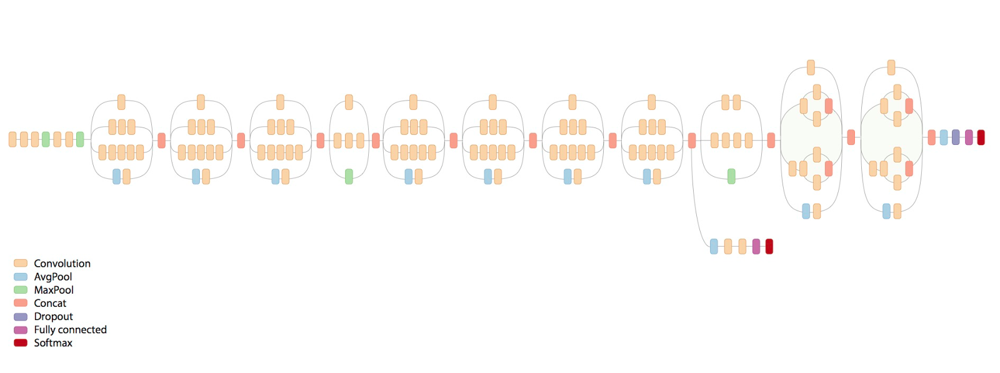

In [4]:
# Read More: 'https://ai.googleblog.com/2016/08/improving-inception-and-image.html'

from IPython.display import Image, display
Image('https://2.bp.blogspot.com/-9KD48z54MBs/V8cVz11fM0I/AAAAAAAABKM/sCC0vVEz_dMOsyb0D8AFwqkrrCavdlkSACLcB/s1600/image02.png')

##Choose 'mixed_7' as the last layer of your base model

In [5]:
# Choose 'mixed_7' as the last layer of your base model
last_layer = pre_trained_model.get_layer('mixed7')
print(f'last layer output shape: {last_layer.output_shape}')
last_output = last_layer.output
print(f'last_output: {last_output}')


last layer output shape: (None, 7, 7, 768)
last_output: KerasTensor(type_spec=TensorSpec(shape=(None, 7, 7, 768), dtype=tf.float32, name=None), name='mixed7/concat:0', description="created by layer 'mixed7'")


##Add dense layers for your classifier

In [6]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import Model

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)

# Add a fully conncted layer with 1024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)

# Add a Dropuot rate of 0.2
x = layers.Dropout(0.2)(x)

# Add a final Dense layer with sigmoid activation
x = layers.Dense(1, activation='sigmoid')(x)

# Append the dense network to the base model
model = Model(inputs=pre_trained_model.input, outputs=x)

# Print the latest model summary
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

##Compile the model

In [7]:
# Set the training parameters
model.compile(optimizer=RMSprop(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

##Download the dataset

In [8]:
# Download the dataset
!wget https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip

# Unzip the files
!unzip cats_and_dogs_filtered.zip > /dev/null

# Delete the cats_and_dogs_filtered.zip file in order not to be confused 
!rm cats_and_dogs_filtered.zip

--2022-04-02 07:28:52--  https://storage.googleapis.com/tensorflow-1-public/course2/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.152.128, 173.194.197.128, 173.194.74.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.152.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘cats_and_dogs_filtered.zip’

cats_and_dogs_filte 100%[===================>]  65.43M  85.1MB/s    in 0.8s    

2022-04-02 07:28:52 (85.1 MB/s) - ‘cats_and_dogs_filtered.zip’ saved [68606236/68606236]



##Prepare the dataset

In [10]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define our example directories and files
base_dir = 'cats_and_dogs_filtered'

train_dir = os.path.join( base_dir, 'train')
validation_dir = os.path.join( base_dir, 'validation')

# Directory with training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 

# Directory with training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs') 

# Directory with validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats') 

# Directory with validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

# Note that the validation data should not be augmented!
val_datagen = ImageDataGenerator( rescale = 1.0/255. )

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size = 20,
                                                    class_mode = 'binary', 
                                                    target_size = (150, 150))     

# Flow validation images in batches of 20 using test_datagen generator
validation_generator =  val_datagen.flow_from_directory( validation_dir,
                                                          batch_size  = 20,
                                                          class_mode  = 'binary', 
                                                          target_size = (150, 150))


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


##Prepare Tensorboard

In [15]:
tensorboard = tf.keras.callbacks.TensorBoard(log_dir="tf_logs", histogram_freq=1)

##Train the model

In [16]:
# Train the model.
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            epochs = 20,
            callbacks=[tensorboard])

Epoch 1/20
100/100 [==============================] - 51s 383ms/step - loss: 0.3711 - accuracy: 0.8630 - val_loss: 0.1117 - val_accuracy: 0.9580
Epoch 2/20
100/100 [==============================] - 50s 498ms/step - loss: 0.2113 - accuracy: 0.9085 - val_loss: 0.1305 - val_accuracy: 0.9490
Epoch 3/20
100/100 [==============================] - 47s 468ms/step - loss: 0.1793 - accuracy: 0.9365 - val_loss: 0.1087 - val_accuracy: 0.9660
Epoch 4/20
100/100 [==============================] - 48s 486ms/step - loss: 0.2135 - accuracy: 0.9245 - val_loss: 0.0931 - val_accuracy: 0.9680
Epoch 5/20
100/100 [==============================] - 45s 453ms/step - loss: 0.1761 - accuracy: 0.9405 - val_loss: 0.1073 - val_accuracy: 0.9630
Epoch 6/20
100/100 [==============================] - 46s 460ms/step - loss: 0.1689 - accuracy: 0.9415 - val_loss: 0.1423 - val_accuracy: 0.9560
Epoch 7/20
100/100 [==============================] - 45s 457ms/step - loss: 0.1832 - accuracy: 0.9360 - val_loss: 0.1120 - val_ac

In [26]:
%load_ext tensorboard
%tensorboard --logdir tf_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 652), started 1:11:06 ago. (Use '!kill 652' to kill it.)

<IPython.core.display.Javascript object>